Importing necessary libraries

In [42]:
import numpy as np
import cv2
import glob
from matplotlib import pyplot as plt
%matplotlib inline  

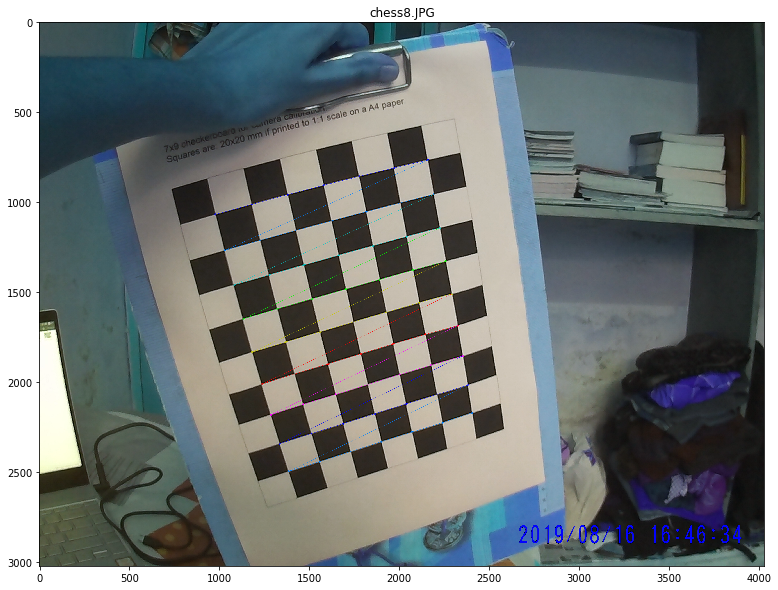

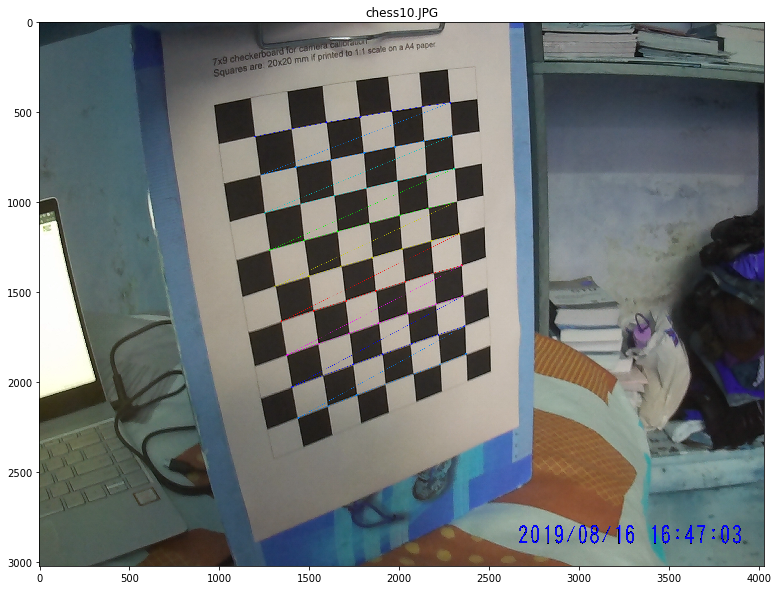

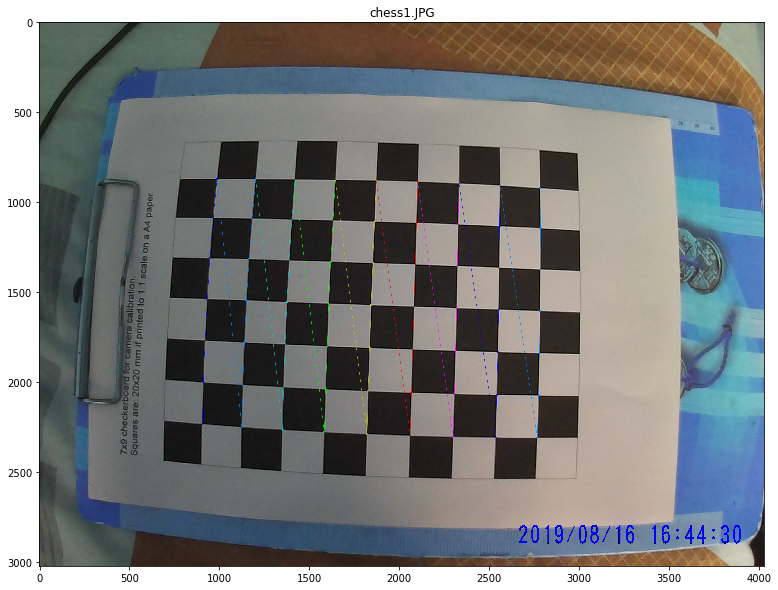

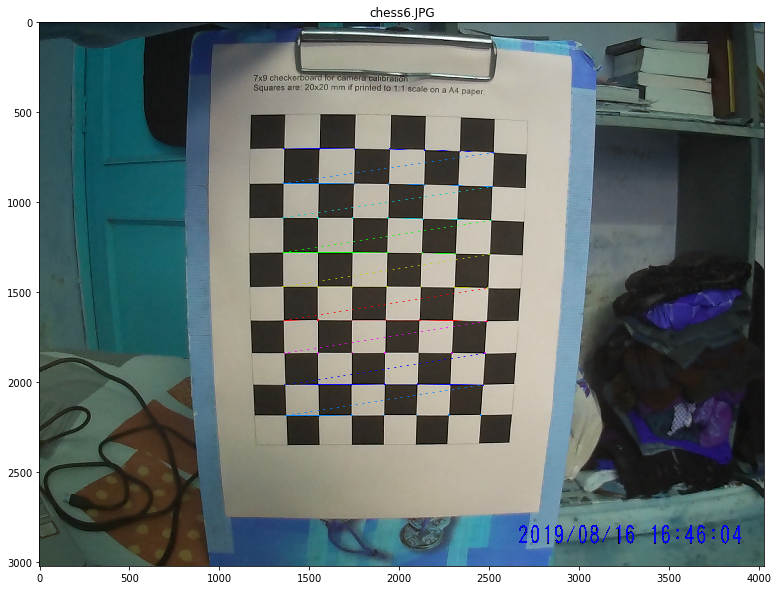

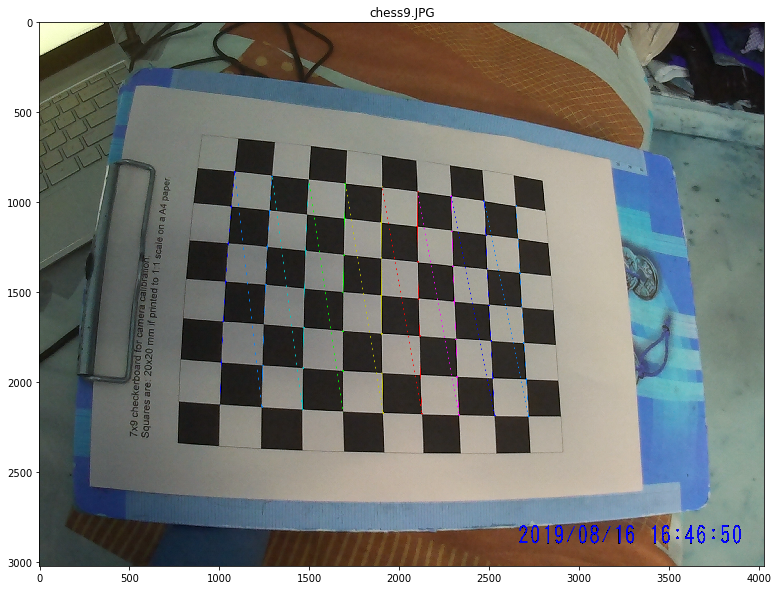

...

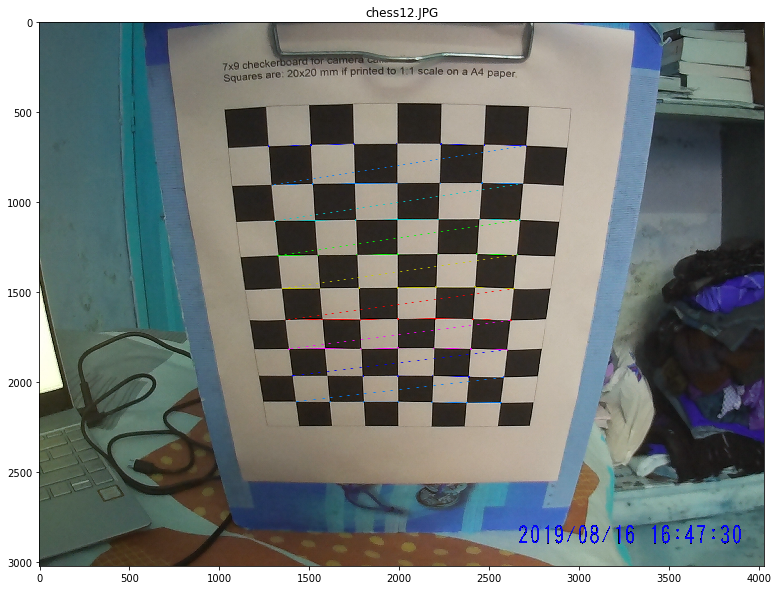

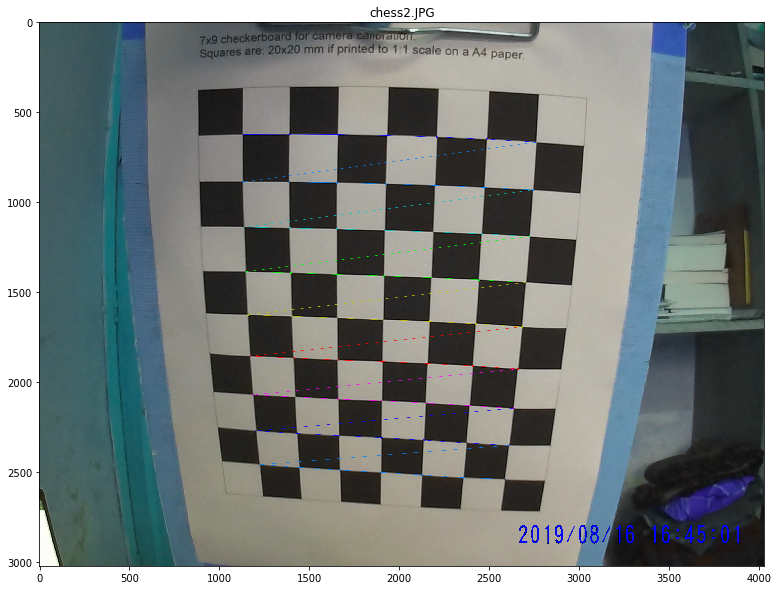

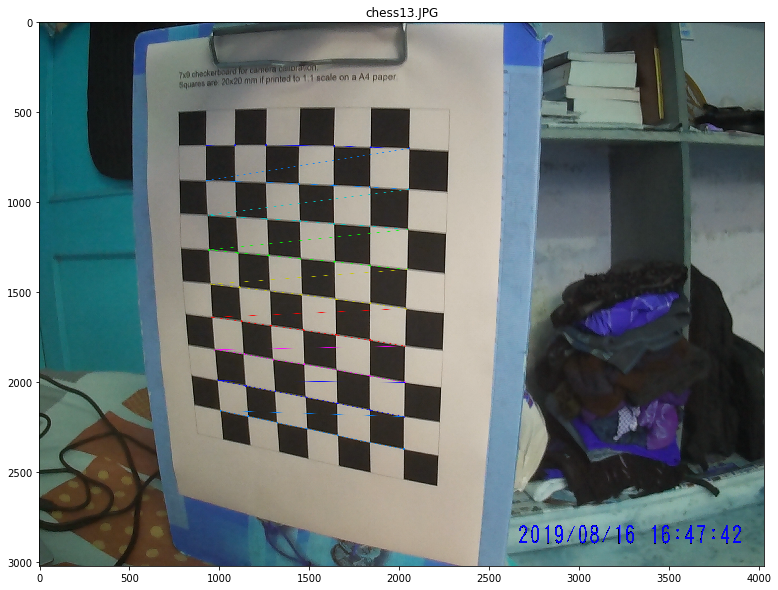

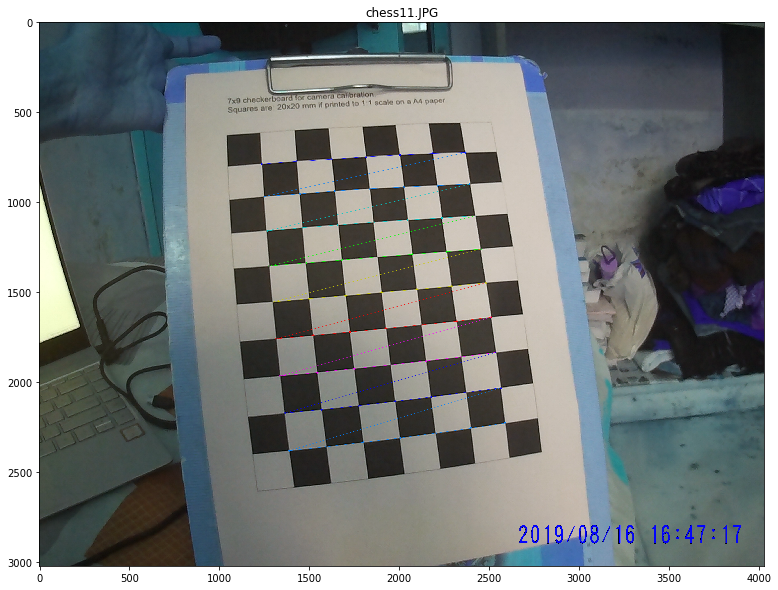

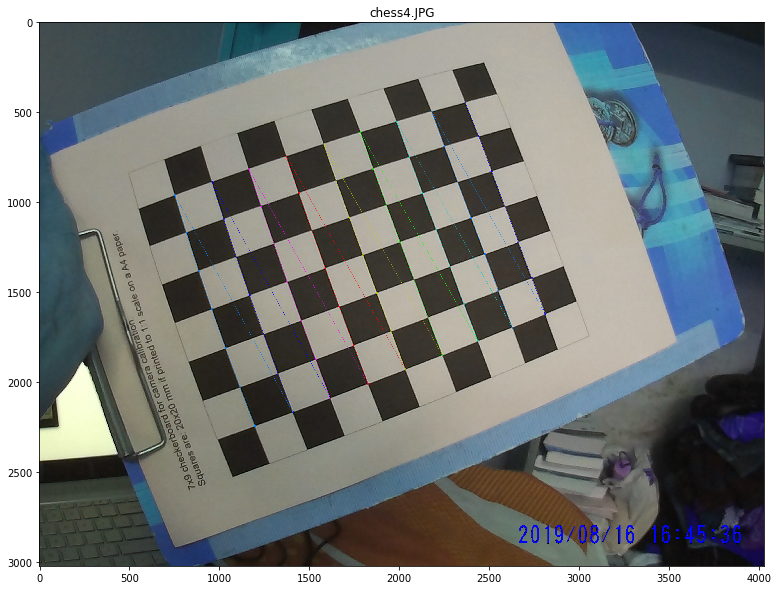

In [50]:
# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.1)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((9*7,3), np.float32)
objp[:,:2] = np.mgrid[0:7,0:9].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

images = glob.glob('chess*.JPG')

for fname in images:
    
    img = cv2.imread(fname)
    
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    
    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, (7,9),None)

    # If found, add object points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners2)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (7,9), corners2,ret)
        #cv2.imshow('img',img)
        plt.imshow(img)
        plt.title(fname)
        plt.rcParams["figure.figsize"] = (20,10)
        plt.show()
        
        #cv2.waitKey(0)

cv2.destroyAllWindows()

In [44]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)


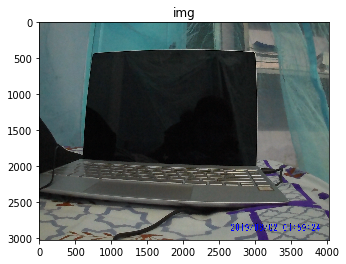

In [45]:
img = cv2.imread('middle.JPG')
h,  w = img.shape[:2]
newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))
plt.imshow(img)
plt.title('img')
plt.show()

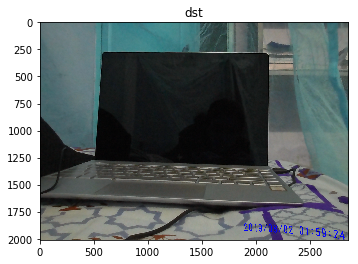

In [46]:
# undistort
dst = cv2.undistort(img, mtx, dist, None, newcameramtx)

# crop the image
x,y,w,h = roi
dst = dst[y:y+h, x:x+w]
cv2.imwrite('calibresult.png',dst)

plt.imshow(dst)
plt.title('dst')
plt.show()